# SWDB Day 1: Data and Tools Overview 

This tutorial provides suggested scaffolding for exploring a new dataset, including basic data access patterns and visualizations to build understanding. Along the way, we'll fill out a README documenting findings in the form of text descriptions, code snippets, and figures. 

## Learning objectives: 
    - Navigate the structure and organization of an Neurodata Without Borders (NWB) file ('pynwb') 
    - Select, align, and summarize neural and behavioral data ('numpy', 'pandas')
    - Build visualizations to develop intuition about the data and perform sanity checks ('matplotlib') 

# Process 

Starting from a scientfic question, the process is as follows: 
1. Write down expectations of what data is available and needed for your question (e.g. neural activity, behavior data, stimulus information)

2. Explore the data structure and organization

3. Load data pieces and inspect 

4. Create visualizations along the way, building in complexity 

Along the way, document important information about the project, such as.... 


# Tutorial 

We'll work through this process for two example datasets (an optical physiology and electrophysiology example). 

To do - say something about other datasets that we aren't covering, what are similarities? note that they have idiosyncracies, so pay attention to the process, not necessarily the exact syntax. 

# V1 Deep Dive 

To do - add context about V1 DD dataset. keep it brief as we want to encourage exploration of the dataset to uncover information. 

<h1 align="center">SWDB Day 1: Data and Tools Overview</h1>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Goal</h2>

This tutorial provides suggested scaffolding for exploring a new dataset, including basic data access patterns and visualizations to build understanding. Along the way, we'll fill out a README documenting findings in the form of text descriptions, code snippets, and figures. 

<h2>Learning objectives</h2>

- Navigate the structure and organization of a Neurodata Without Borders (NWB) file (`pynwb`)
- Select, align, and summarize neural and behavioral data, stimulus tables(`numpy`, `pandas`)
- Build visualizations to develop intuition about the data and perform sanity checks (`matplotlib`)

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Process</h2>

Starting from a scientific question, the process is as follows:

1. Write down expectations of what data is available and needed for your question
2. Explore the data structure and vocabulary
3. Extract and inspect the data pieces you need
4. Create visualizations along the way, increasing in complexity 

The Allen Institute datasets are standardized to common core frameworks, so data access patterns roughly align across them, but each dataset has idiosyncrasies. Pay attention to the process and the skills, not necessarily the exact syntax or paths.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>V1 Deep Dive</h2>

to do - add brief context about the V1DD dataset. 

say something about other datasets not covered, what are similarities (NWB format) and differences (different organization)

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

If you have a scientific question in mind, list out the data you need, then list what the documentation says is available.

**Scientific question (V1DD):** Structure/function relationships — how does the amplitude of a neuron's response relate to its connectivity?

**Data needs:**

| Category | What to look for |
| -------- | ------- |
| Neural activity | Is it raw or processed? (e.g. raw calcium movies I need to extract signal from, vs. dF/F per ROI) |
| Stimulus | Stimulus tables |
| Behavior | Behavior tables (e.g. rewards, hits/misses), behavior timeseries (running, pupil) |
| Metadata | Animal and genotype information |

</div>

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercise:** Write down what data you expect this dataset to have, based on the documentation. Record it in the README.

Does this dataset have everything you need to answer your question?

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Setup</h2>

</div>

In [100]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pynwb

data_dir = '/data'

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Set a few plotting defaults so every figure in the notebook comes out consistent, without repeating the same styling arguments each time.

</div>

In [101]:
plt.rcParams['figure.figsize'] = (10, 3)
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['figure.constrained_layout.use'] = True

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Part 2: Explore data structure and vocabulary</h2>

#### File organization

Start by exploring how the `/data` folder is laid out.

</div>

In [102]:
# First, explore the /data folder organization.
os.listdir('/data')

# in the end, there will be a folder for each project dataset (combined data asset) and a metadata folder. 
# for V1DD, folder for each subject ('subject_V1DD_Filtered')

['ecephys_664851_2023-11-15_12-38-21_nwb_2026-05-18_21-58-33',
 'ecephys_759434_2025-02-04_12-27-22_nwb_2026-05-18_21-56-27',
 'ecephys_668755_2023-08-31_12-33-31_nwb_2026-05-18_21-59-03',
 'ecephys_742903_2024-10-22_10-58-35_nwb_2026-05-18_22-02-14',
 'ecephys_713655_2024-08-09_10-41-47_nwb_2026-05-18_21-59-59',
 '438833_V1DD_Filtered',
 'brain-computer-interface-v2',
 'Neuropixels_Opto_ecephys_nwb_combined',
 '409828_V1DD_Filtered',
 '416296_V1DD_Filtered',
 'metadata']

In [103]:
os.listdir(os.path.join(data_dir, '409828_V1DD_Filtered'))

# within a subject folder, there is a folder for each session
# (e.g. subject_session_filtered_processingdate)

['409828_2018-11-06_14-02-59_filtered_2026-04-09_04-59-00',
 '409828_2018-11-20_10-42-45_filtered_2026-04-09_04-58-44',
 '409828_2018-11-20_12-12-08_filtered_2026-05-15_00-15-57',
 '409828_2018-11-21_09-22-23_filtered_2026-04-16_02-51-11',
 '409828_2018-11-21_10-56-07_filtered_2026-04-09_05-50-02',
 '409828_2018-11-26_11-16-25_filtered_2026-04-09_05-50-03',
 '409828_2018-11-27_11-01-58_filtered_2026-04-09_05-50-34',
 '409828_2018-11-27_12-29-05_filtered_2026-04-09_05-50-36',
 '409828_2018-11-28_10-54-56_filtered_2026-04-16_09-56-00',
 '409828_2018-11-29_13-42-04_filtered_2026-04-09_05-50-33',
 '409828_2018-12-03_14-25-24_filtered_2026-04-09_05-50-36',
 '409828_2018-12-03_15-56-23_filtered_2026-04-09_05-54-06',
 '409828_2018-12-04_15-27-53_filtered_2026-04-09_05-57-20',
 '409828_2018-12-05_14-40-32_filtered_2026-04-09_05-50-22',
 '409828_2018-12-07_15-05-38_filtered_2026-04-09_05-50-47',
 '409828_2018-12-10_14-02-21_filtered_2026-04-09_05-54-42',
 '409828_2018-12-10_15-28-55_filtered_20

<div style="border-left: 3px solid #C00; padding: 1px; padding-left: 10px; background: #FFF6F0; ">

<b>TO DO:</b> Is there documentation for the naming schemes we can point to?

</div>

In [104]:
session_dir = os.path.join(
    data_dir,
    '409828_V1DD_Filtered',
    '409828_2018-11-06_14-02-59_filtered_2026-04-09_04-59-00',
)

os.listdir(session_dir)

# within each session folder there is an NWB file (subject_session.nwb.zarr)
# plus metadata json files
# the data is in nwb.zarr format, a zarr-based storage format for NWB that allows
# for efficient cloud storage and streaming# within each session folder, there will be a folder for each session NWB file (e.g. subject_session.nwb.zarr) as well as metadata json files 
# the data is in nwb.zarr format, which is a zarr-based storage format for NWB. allows for efficient cloud storage and streaming. 

['metadata.nd.json',
 '409828_2018-11-06_14-02-59.nwb.zarr',
 'procedures.json',
 'processing.json',
 'instrument.json',
 'output',
 'subject.json',
 'data_description.json',
 'original_metadata',
 'acquisition.json']

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercise:** Document the data organization in *V1DD_README.md*.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Metadata

Each project dataset has a metadata CSV file in the */data/metadata* folder. This file is pre-generated from the metadata database and contains information about each session.

</div>

In [105]:
# Metadata 
os.listdir('/data/metadata')

['V1DD_metadata.csv']

In [106]:
# Each row corresponds to a session and each column contains different metadata fields. 
metadata = pd.read_csv(os.path.join(data_dir, 'metadata', 'V1DD_metadata.csv'), index_col=False)
metadata

,project_name,_id,name,subject_id,golden_mouse,genotype,date_of_birth,sex,modality,session_date,age,session_time,column,volume
0,V1 Deep Dive,3b85c659-20c8-438f-ab58-de1aac3b81cf,416296_2018-11-29_12-08-40_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-11-29,115,12:08:40.014190,2,5
1,V1 Deep Dive,b98ce4a9-a66b-4b70-baa6-95ef451ae087,427836_2019-04-25_12-16-58_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-25,199,12:16:58.240890,5,3
2,V1 Deep Dive,5cccd09c-4ae8-4d8e-ae92-23099d22bbe2,427836_2019-04-24_13-06-45_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-24,198,13:06:45.257460,4,3
3,V1 Deep Dive,911d215f-dafa-4b39-86f7-b36336974da1,427836_2019-04-25_13-49-39_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-25,199,13:49:39.163550,5,4
4,V1 Deep Dive,c918f874-d534-4341-b0dc-f1aba388af66,427836_2019-04-26_12-54-40_nwb_2025-08-08_16-2...,427836,False,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,2018-10-08,Female,"['Planar optical physiology', 'Behavior videos']",2019-04-26,200,12:54:40.332660,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,V1 Deep Dive,52b95969-9c9d-4eab-bbec-8e4c5a0f078d,416296_2018-12-04_13-45-25_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-12-04,120,13:45:25.427340,5,3
96,V1 Deep Dive,08164a2c-f0e6-4e48-853d-7fcda83dafab,416296_2018-12-05_11-31-44_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-12-05,121,11:31:44.290780,5,4
97,V1 Deep Dive,1f103471-2fc0-4423-b77f-989d43ee3be6,416296_2018-12-07_13-19-39_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-12-07,123,13:19:39.881600,4,5
98,V1 Deep Dive,392c2437-babc-4aec-b13c-11b5f449d799,416296_2018-11-30_13-10-57_nwb_2025-08-08_16-2...,416296,False,Camk2a-tTA/wt;tetO-GCaMP6s/wt,2018-08-06,Female,"['Planar optical physiology', 'Behavior videos']",2018-11-30,116,13:10:57.408410,3,5


In [8]:
# What metadata is available? 
metadata.columns

# to do: add further resources for metadata exploration. should we call out mcp server? 

Index(['project_name', '_id', 'name', 'subject_id', 'golden_mouse', 'genotype',
       'date_of_birth', 'sex', 'modality', 'session_date', 'age',
       'session_time', 'column', 'volume'],
      dtype='object')

In [9]:
# How many sessions are available? 
metadata.shape

(100, 14)

In [10]:
# What are the data modalities? 
metadata.modality.unique()

# Questions - are behavior videos available with the NWB file? 

array(["['Planar optical physiology', 'Behavior videos']"], dtype=object)

In [11]:
# How many subjects in the dataset? 
metadata.subject_id.nunique()

4

In [12]:
# Number of sessions per subject 
metadata.subject_id.value_counts()

subject_id
416296    25
427836    25
438833    25
409828    25
Name: count, dtype: int64

In [13]:
# What do the 'column' and 'volume' columns represent? 

metadata[['column', 'volume']].value_counts()

# for each subject, a volume within a structural column in V1 was imaged 

column  volume
1       1         4
        2         4
        3         4
        4         4
        5         4
2       1         4
        2         4
        3         4
        4         4
        5         4
3       1         4
        2         4
        3         4
        4         4
        5         4
4       1         4
        2         4
        3         4
        4         4
        5         4
5       1         4
        2         4
        3         4
        4         4
        5         4
Name: count, dtype: int64

In [14]:
# What are unique genotypes in the dataset? 
metadata.genotype.unique() 
# or use 
# set(metadata.genotype)

# In plain language, what are the genotypes? Refer to the data book documentation  

array(['Camk2a-tTA/wt;tetO-GCaMP6s/wt',
       'Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-GCaMP6s)/wt'],
      dtype=object)

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercise:** Update the README with the useful information we've learned about the dataset (e.g. number of sessions, subjects, genotypes, vocabulary).

</div>

In [16]:
# Exercise: 

# Come up with another metadata exploration question and write the code to answer it. 

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Open a session NWB file

to do: write something about NWB files as a standard for neurophysiology data. 


</div>



In [107]:
nwb_path = os.path.join(session_dir, '409828_2018-11-06_14-02-59.nwb.zarr')
nwb = pynwb.read_nwb(nwb_path)

nwb

root pynwb.file.NWBFile at 0x140012369419808
Fields:
  acquisition: {
    vasculature_maps <class 'pynwb.base.Images'>
  }
  devices: {
    DEEPSCOPE <class 'pynwb.device.Device'>
  }
  epochs: epochs <class 'pynwb.epoch.TimeIntervals'>
  experiment_description: 2-photon imaging of column 2, volume 1
  file_create_date: [datetime.datetime(2025, 12, 15, 19, 45, 15, 752494, tzinfo=tzoffset(None, -28800))]
  identifier: 992c7efa-1f27-431d-a5cc-94e8a81aafa8
  imaging_planes: {
    plane-0 <class 'pynwb.ophys.ImagingPlane'>,
    plane-1 <class 'pynwb.ophys.ImagingPlane'>,
    plane-2 <class 'pynwb.ophys.ImagingPlane'>,
    plane-3 <class 'pynwb.ophys.ImagingPlane'>,
    plane-4 <class 'pynwb.ophys.ImagingPlane'>,
    plane-5 <class 'pynwb.ophys.ImagingPlane'>
  }
  institution: Allen Institute
  intervals: {
    epochs <class 'pynwb.epoch.TimeIntervals'>,
    stimulus_table <class 'pynwb.epoch.TimeIntervals'>
  }
  keywords: <zarr.core.Array '/general/keywords' (4,) object read-only>
  processing: {
    behavior <class 'pynwb.base.ProcessingModule'>,
    plane-0 <class 'pynwb.base.ProcessingModule'>,
    plane-1 <class 'pynwb.base.ProcessingModule'>,
    plane-2 <class 'pynwb.base.ProcessingModule'>,
    plane-3 <class 'pynwb.base.ProcessingModule'>,
    plane-4 <class 'pynwb.base.ProcessingModule'>,
    plane-5 <class 'pynwb.base.ProcessingModule'>
  }
  session_description: V1 Deep Dive, Golden Mouse
  session_id: 774328450
  session_start_time: 2018-11-06 14:02:59-08:00
  stimulus: {
    locally_sparse_noise <class 'pynwb.base.Images'>,
    natural_images <class 'pynwb.base.Images'>,
    natural_movie <class 'pynwb.base.Images'>
  }
  subject: subject pynwb.file.Subject at 0x140012446730288
Fields:
  age: 126
  age__reference: birth
  description: Golden Mouse
  genotype: Slc17a7-IRES2-Cre;Camk2a-tTA;Ai94
  sex: male
  species: Mus musculus
  subject_id: 409828

  timestamps_reference_time: 2018-11-06 14:02:59-08:00

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

Which containers hold the key data pieces?

- Neural activity
- Stimulus information
- Behavior data

Note where each piece lives. Is anything missing or unexpected?

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Part 3: Extract and inspect the data pieces</h2>

Which containers are the key data pieces stored in?

-Neural activity 

-Stimulus information

-Behavior data 

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Neural activity

Neural activity is stored in the *<b>processing</b>* container. Use `.` to see the options.

</div>

In [18]:
# Neural activity 

# to do - might change the order to show the images/ROIs first, then dff 

# stored in the processing container of the NWB file

# processing has behavior data and planes - each volume contains 6 planes
# open up data for a single plane. 
# use . to see options

nwb.processing

{'behavior': behavior pynwb.base.ProcessingModule at 0x140013063489824
 Fields:
   data_interfaces: {
     eye_tracking <class 'hdmf.common.table.DynamicTable'>,
     running_speed <class 'pynwb.base.TimeSeries'>
   }
   description: processed behavioral data,
 'plane-0': plane-0 pynwb.base.ProcessingModule at 0x140013066321792
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-1': plane-1 pynwb.base.ProcessingModule at 0x140013066134224
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-2': plane-2 pynwb.base.ProcessingModule at 0x140013066129952
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-3': plane-3 pynwb.base.ProcessingModule at 0x140013036436224
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-4': plane-4 pynwb.base.ProcessingModule at 0x140013036426624
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module,
 'plane-5': plane-5 pynwb.base.ProcessingModule at 0x140013036435216
 Fields:
   data_interfaces: {
     demixed <class 'pynwb.ophys.RoiResponseSeries'>,
     dff <class 'pynwb.ophys.RoiResponseSeries'>,
     events <class 'pynwb.ophys.RoiResponseSeries'>,
     image_segmentation <class 'pynwb.ophys.ImageSegmentation'>,
     images <class 'pynwb.base.Images'>,
     neuropil_corrected <class 'pynwb.ophys.RoiResponseSeries'>,
     neuropil_fluorescence <class 'pynwb.ophys.RoiResponseSeries'>,
     raw <class 'pynwb.ophys.RoiResponseSeries'>
   }
   description: Single-plane ophys processing module}

In [19]:
# Neural activity data is stored by plane. (6 planes total). 

nwb.processing['plane-0']

# Say something about what data pieces are available in each plane container 
# Importantly - raw, neuropil, dff, image segmentation, images, events (?) 

# What data do we likely want to work with?  

Data type,float32
Shape,"(22029, 9)"
Array size,774.46 KiB
Data type,float64
Shape,"(22029,)"
Array size,172.10 KiB
Data type,float64
Shape,"(3,)"
Array size,24.00 bytes
Data type,float64
Shape,"(2,)"


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Load the dF/F traces and their timestamps, then check the shape of each.

</div>

In [108]:
# Load the neural activity data (dff) and inspect its structure 

dff = nwb.processing['plane-0']['dff'].data
ts = nwb.processing['plane-0']['dff'].timestamps[:]

print('dff shape (nframes, nrois):', np.shape(dff))
print('timestamps shape (nframes,):', np.shape(ts))

# What does the shape correspond to? 
# frames x rois 
# to do - maybe get frame rate  

dff shape (nframes, nrois): (22029, 9)
timestamps shape (nframes,): (22029,)


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

As a sanity check on the structure of the data, plot the dF/F trace for a single ROI against time.

</div>

Text(0.5, 1.0, 'Calcium Activity Trace')

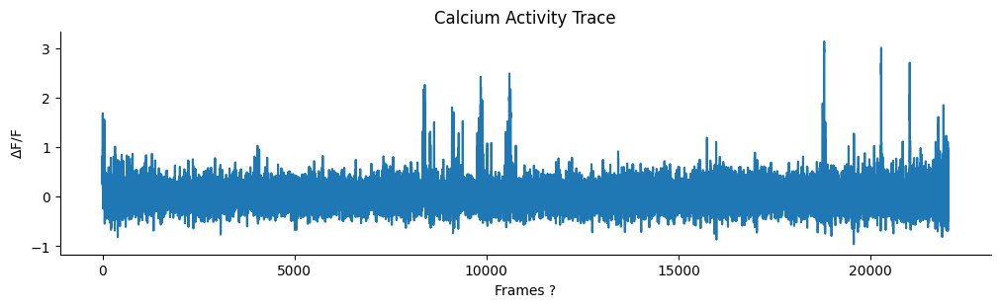

In [110]:
ROI = 0 

plt.plot(dff[:, ROI])
plt.ylabel(r'$\Delta$F/F')
plt.xlabel('Frames ?')
plt.title('Calcium Activity Trace')

(22029,)


Text(0.5, 1.0, 'Calcium Activity Trace')

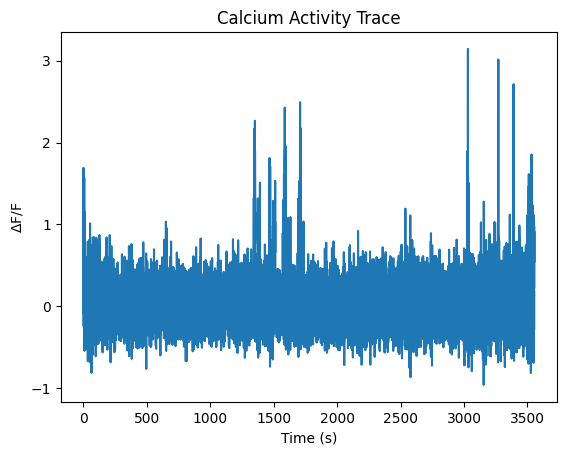

In [22]:
# We have timestamps, if we plot against time, this should roughly match the session duration 
# to do - add session end time to metadata CSVs to get session duration as a sanity check 

# Get timestamps from the NWB file 
ts = nwb.processing['plane-0']['dff'].timestamps[:]
print(np.shape(ts))

# Plot dff for a single ROI against time 
plt.plot(ts, dff[:, ROI])
plt.ylabel(r'$\Delta$F/F')
plt.xlabel('Time (s)')
plt.title('Calcium Activity Trace')

In [23]:
3500/60

# to do - get session end time into metadata to compare to session duration from timestamps 

# ~1 hour recording session 

58.333333333333336

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### ROIs

Within the `dff` container there is also a table of ROIs. Save it as a pandas dataframe.

</div>

In [ ]:
roi_table = nwb.processing['plane-0']['dff'].rois.to_dataframe()
roi_table

# see equivalent number of ROIs as columns in the dff shape 
# assume each column corresponds to each row in this table 

# to call out - ROI index is not continuous, filtered for somas 
# what is pika_roi_id and pika_roi_confidence? 
# pixel mask structure - what is this? masks out the spatial region where the masks are in the image 

,column,volume,plane,roi,pika_roi_id,pika_roi_confidence,is_soma,pixel_mask
id,,,,,,,,
0,2,1,0,0,774393041_0000,0.916531,True,"[[115, 260, 1.0], [112, 261, 1.0], [113, 261, ..."
1,2,1,0,1,774393041_0001,0.916861,True,"[[207, 284, 1.0], [208, 284, 1.0], [209, 284, ..."
2,2,1,0,2,774393041_0002,0.913705,True,"[[247, 97, 1.0], [248, 97, 1.0], [244, 98, 1.0..."
3,2,1,0,4,774393041_0004,0.915848,True,"[[159, 335, 1.0], [160, 335, 1.0], [161, 335, ..."
4,2,1,0,5,774393041_0005,0.912224,True,"[[135, 358, 1.0], [136, 358, 1.0], [137, 358, ..."
5,2,1,0,7,774393041_0007,0.912520,True,"[[390, 463, 1.0], [391, 463, 1.0], [392, 463, ..."
6,2,1,0,9,774393041_0009,0.916683,True,"[[300, 343, 1.0], [301, 343, 1.0], [302, 343, ..."
7,2,1,0,65,774393041_0066,0.912281,True,"[[142, 273, 1.0], [143, 273, 1.0], [144, 273, ..."
8,2,1,0,149,774393041_0151,0.522310,True,"[[344, 448, 1.0], [345, 448, 1.0], [346, 448, ..."


In [ ]:
print('pixel_mask shape:', np.shape(roi_table.pixel_mask[0]))

roi_table.pixel_mask[0]

# each row is (x, y, weight) for one pixel belonging to the ROI

pixel_mask shape: (186,)


array([(115, 260, 1.), (112, 261, 1.), (113, 261, 1.), (114, 261, 1.),
       (115, 261, 1.), (116, 261, 1.), (117, 261, 1.), (118, 261, 1.),
       (111, 262, 1.), (112, 262, 1.), (113, 262, 1.), (114, 262, 1.),
       (115, 262, 1.), (116, 262, 1.), (117, 262, 1.), (118, 262, 1.),
       (119, 262, 1.), (110, 263, 1.), (111, 263, 1.), (112, 263, 1.),
       (113, 263, 1.), (114, 263, 1.), (115, 263, 1.), (116, 263, 1.),
       (117, 263, 1.), (118, 263, 1.), (119, 263, 1.), (120, 263, 1.),
       (110, 264, 1.), (111, 264, 1.), (112, 264, 1.), (113, 264, 1.),
       (114, 264, 1.), (115, 264, 1.), (116, 264, 1.), (117, 264, 1.),
       (118, 264, 1.), (119, 264, 1.), (120, 264, 1.), (121, 264, 1.),
       (109, 265, 1.), (110, 265, 1.), (111, 265, 1.), (112, 265, 1.),
       (113, 265, 1.), (114, 265, 1.), (115, 265, 1.), (116, 265, 1.),
       (117, 265, 1.), (118, 265, 1.), (119, 265, 1.), (120, 265, 1.),
       (121, 265, 1.), (122, 265, 1.), (108, 266, 1.), (109, 266, 1.),
      

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

To plot the masks we need an image of the field of view. These are stored in the *<b>images</b>* container of the plane.

</div>

In [112]:
nwb.processing['plane-0']['images']

images pynwb.base.Images at 0x140012343326048
Fields:
  description: Summary images of the ophys movie
  images: {
    correlation_projection_denoised_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    max_projection_denoised_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    max_projection_raw_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    mean_projection_denoised_plane-0 <class 'pynwb.image.GrayscaleImage'>,
    mean_projection_raw_plane-0 <class 'pynwb.image.GrayscaleImage'>
  }

max projection shape (H, W): (512, 512)


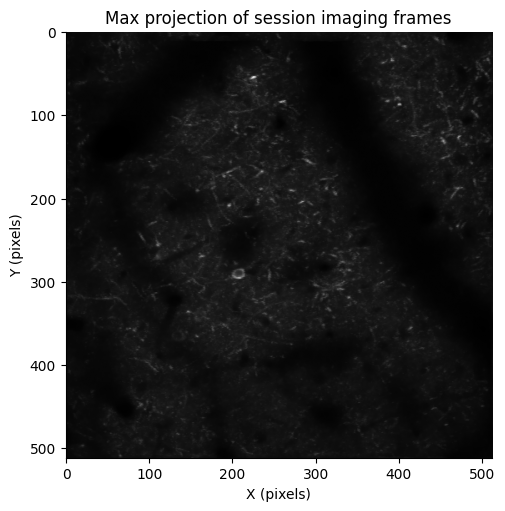

In [115]:
max_projection = nwb.processing['plane-0']['images']['max_projection_denoised_plane-0'].data[:]
print('max projection shape (H, W):', max_projection.shape)

plt.figure(figsize=(5, 5))
plt.imshow(max_projection, cmap='gray', origin='upper', aspect='equal')
plt.xlabel('X (pixels)')
plt.ylabel('Y (pixels)')
plt.title('Max projection of session imaging frames')
plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Now overlay the pixel mask for every ROI on top of the projection image.

</div>

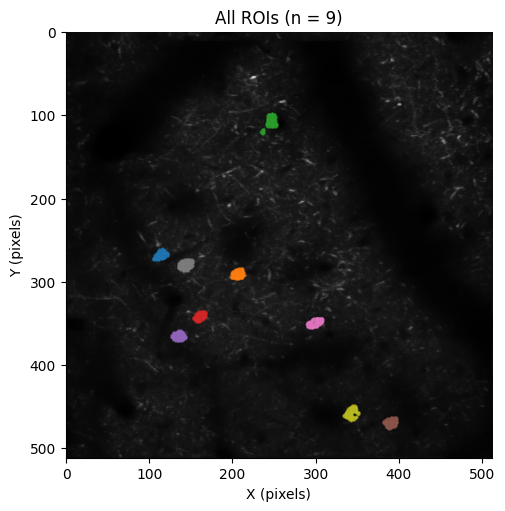

In [116]:
plt.figure(figsize=(5, 5))
plt.imshow(max_projection, cmap='gray', origin='upper', aspect='equal')

for pm in roi_table.pixel_mask:
    plt.scatter(pm['x'], pm['y'], s=0.5, alpha=0.5)

plt.xlabel('X (pixels)')
plt.ylabel('Y (pixels)')
plt.title(f'All ROIs (n = {len(roi_table)})')
plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Put the two together: for one ROI, show its activity trace next to where it sits in the field of view.

</div>

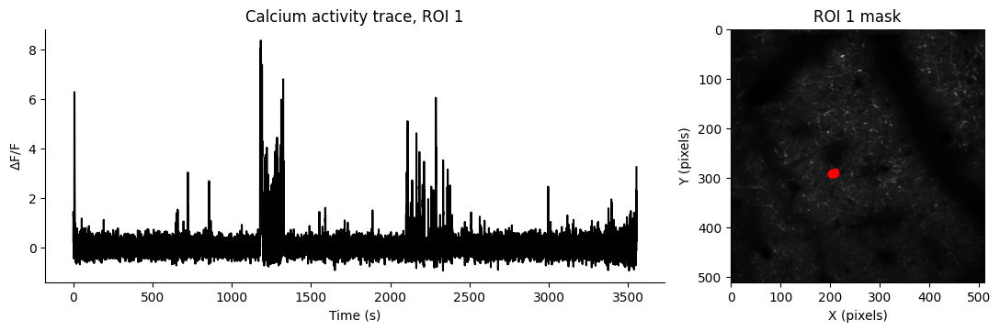

In [118]:
ROI = 1

fig, axes = plt.subplots(1, 2, figsize=(11, 3.5), width_ratios=[2, 1])

axes[0].plot(ts, dff[:, ROI], color='black')
axes[0].set_xlabel('Time (s)')
axes[0].set_ylabel(r'$\Delta$F/F')
axes[0].set_title(f'Calcium activity trace, ROI {ROI}')

axes[1].imshow(max_projection, cmap='gray', origin='upper', aspect='equal')
pm = roi_table.pixel_mask[ROI]
axes[1].scatter(pm['x'], pm['y'], s=2, color='red')
axes[1].set_xlabel('X (pixels)')
axes[1].set_ylabel('Y (pixels)')
axes[1].set_title(f'ROI {ROI} mask')

plt.show()

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercise:** Pause here to document information, code snippets, and figures in the README.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Behavior

Behavior data is also stored in the *<b>processing</b>* container.

</div>

In [119]:
# Behavior data is also stored in the processing container 

nwb.processing['behavior']

# Running speed as an array with a corresponding timestamps array and eye tracking as a table 

behavior pynwb.base.ProcessingModule at 0x140012464916576
Fields:
  data_interfaces: {
    eye_tracking <class 'hdmf.common.table.DynamicTable'>,
    running_speed <class 'pynwb.base.TimeSeries'>
  }
  description: processed behavioral data

# Store the behavior data 
<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Pull each behavior stream into its own variable. Converting to numpy arrays here means we can filter and slice them the same way as the neural data later on.

</div>

In [ ]:
running_speed = nwb.processing['behavior']['running_speed'].data[:]
running_ts = nwb.processing['behavior']['running_speed'].timestamps[:]

eye_tracking_table = nwb.processing['behavior']['eye_tracking'].to_dataframe()
eye_ts = eye_tracking_table.timestamps.values
pupil_area = eye_tracking_table['pupil_area'].values

print('running_speed:', running_speed.shape, '| running_ts:', running_ts.shape)
print('eye_tracking_table:', eye_tracking_table.shape, '(frames, features)')

#Each stream has its own timestamps, collected at its own rate. As a sanity check, `running_speed` and `running_ts` are the same length, and the last timestamp of each stream should land near the end of the session (~3500 s) — so all three span the same time range. 


running_speed: (209040,) | running_ts: (209040,)
eye_tracking_table: (106463, 20) (frames, features)


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Plot all three streams stacked on a shared time axis. `sharex=True` locks the panels together so the same x window applies to all of them.

</div>

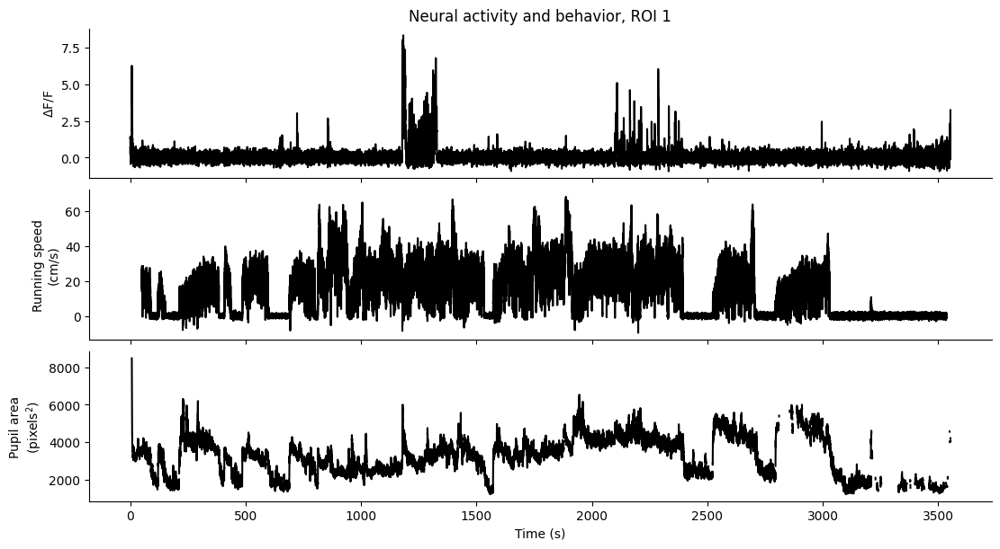

In [121]:
ROI = 1

fig, axes = plt.subplots(3, 1, figsize=(11, 6), sharex=True)

axes[0].plot(ts, dff[:, ROI], color='black')
axes[0].set_ylabel(r'$\Delta$F/F')
axes[0].set_title(f'Neural activity and behavior, ROI {ROI}')

axes[1].plot(running_ts, running_speed, color='black')
axes[1].set_ylabel('Running speed\n(cm/s)')

axes[2].plot(eye_ts, pupil_area, color='black')
axes[2].set_ylabel('Pupil area\n(pixels$^2$)')
axes[2].set_xlabel('Time (s)')

plt.show()

# units are found in the metadata within the NWB file

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercise:** Pause to discuss the plot. What should we document in the README?

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Epoch and stimulus tables

Epoch and stimulus information is stored in the *<b>intervals</b>* container.

</div>

In [122]:
# Epoch and stimulus information is stored in the intervals container 

nwb.intervals

{'epochs': epochs pynwb.epoch.TimeIntervals at 0x140012464839072
 Fields:
   colnames: ['stim_name' 'start_time' 'stop_time' 'duration']
   columns: (
     stim_name <class 'hdmf.common.table.VectorData'>,
     start_time <class 'hdmf.common.table.VectorData'>,
     stop_time <class 'hdmf.common.table.VectorData'>,
     duration <class 'hdmf.common.table.VectorData'>
   )
   description: Start and stop times for all stimulus epochs
   id: id <class 'hdmf.common.table.ElementIdentifiers'>,
 'stimulus_table': stimulus_table pynwb.epoch.TimeIntervals at 0x140012486695616
 Fields:
   colnames: ['stim_name' 'start_time' 'stop_time' 'temporal_frequency'
  'spatial_frequency' 'center_azimuth' 'center_elevation' 'direction'
  'frame' 'image_order' 'image_index' 'stimulus_condition_id']
   columns: (
     stim_name <class 'hdmf.common.table.VectorData'>,
     start_time <class 'hdmf.common.table.VectorData'>,
     stop_time <class 'hdmf.common.table.VectorData'>,
     temporal_frequency <class 'hdmf.common.table.VectorData'>,
     spatial_frequency <class 'hdmf.common.table.VectorData'>,
     center_azimuth <class 'hdmf.common.table.VectorData'>,
     center_elevation <class 'hdmf.common.table.VectorData'>,
     direction <class 'hdmf.common.table.VectorData'>,
     frame <class 'hdmf.common.table.VectorData'>,
     image_order <class 'hdmf.common.table.VectorData'>,
     image_index <class 'hdmf.common.table.VectorData'>,
     stimulus_condition_id <class 'hdmf.common.table.VectorData'>
   )
   description: Trial times & parameters all stimulus
   id: id <class 'hdmf.common.table.ElementIdentifiers'>}

In [40]:
# Epochs table 
epochs = nwb.intervals['epochs'].to_dataframe()
epochs 

# each epoch corresponds to a different stimulus or experiment condition 

,stim_name,start_time,stop_time,duration
id,,,,
0,drifting_gratings_full,52.851639,340.074066,287.222412
1,drifting_gratings_windowed,343.093262,630.315857,287.222595
2,locally_sparse_noise,633.335022,873.551819,240.216797
3,spontaneous,874.536011,1174.769409,300.233398
4,natural_images_12,1177.788696,1329.898682,152.109985
5,natural_movie,1341.925293,1792.283813,450.358521
6,locally_sparse_noise,1796.337280,2096.453857,300.116577
7,natural_images,2098.555664,2397.721436,299.165771
8,drifting_gratings_windowed,2412.817383,2700.039795,287.222412


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

The stimulus table contains more detailed information about the stimulus conditions. Each row is a single stimulus presentation, with start and stop times, stimulus name, and other features. It spans across epochs.

</div>

In [123]:
stimulus_table = nwb.intervals['stimulus_table'].to_dataframe()
stimulus_table

,stim_name,start_time,stop_time,temporal_frequency,spatial_frequency,center_azimuth,center_elevation,direction,frame,image_order,image_index,stimulus_condition_id
id,,,,,,,,,,,,
0,drifting_gratings_full,52.851639,54.836639,1.0,0.08,0.0,0.0,300.0,NaN,NaN,NaN,22
1,drifting_gratings_full,55.854118,57.839161,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,24
2,drifting_gratings_full,58.856628,60.841621,1.0,0.04,0.0,0.0,300.0,NaN,NaN,NaN,10
3,drifting_gratings_full,61.859138,63.844120,1.0,0.04,0.0,0.0,240.0,NaN,NaN,NaN,8
4,drifting_gratings_full,64.861656,66.846611,1.0,0.08,0.0,0.0,330.0,NaN,NaN,NaN,23
...,...,...,...,...,...,...,...,...,...,...,...,...
33209,natural_movie,3535.585693,3535.602295,NaN,NaN,NaN,NaN,NaN,895.0,NaN,NaN,2668
33210,natural_movie,3535.618896,3535.635742,NaN,NaN,NaN,NaN,NaN,896.0,NaN,NaN,2669
33211,natural_movie,3535.652344,3535.668945,NaN,NaN,NaN,NaN,NaN,897.0,NaN,NaN,2670


In [124]:
# How many presentations of each stimulus type were there? 

stimulus_table.stim_name.value_counts()

# could also use: stimulus_table.groupby('stim_name').size()

stim_name
natural_movie                 29700
locally_sparse_noise           1705
natural_images                  944
natural_images_12               480
drifting_gratings_full          192
drifting_gratings_windowed      192
spontaneous                       1
Name: count, dtype: int64

In [125]:
# How many unique stimuli were presented within each stimuli type? 
stimulus_table.groupby('stim_name')['stimulus_condition_id'].nunique()

stim_name
drifting_gratings_full          25
drifting_gratings_windowed      25
locally_sparse_noise          1593
natural_images                 118
natural_images_12               12
natural_movie                 3600
spontaneous                      1
Name: stimulus_condition_id, dtype: int64

In [126]:
# How many times were each individual sitmulus presented? For simplicity, look at just the natural images. 
natural = stimulus_table[stimulus_table.stim_name == 'natural_images']

natural.stimulus_condition_id.value_counts()

stimulus_condition_id
1643    8
1644    8
1645    8
1646    8
1647    8
       ..
1756    8
1757    8
1758    8
1759    8
1760    8
Name: count, Length: 118, dtype: int64

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Some of the stimuli that were presented are stored in the *<b>stimulus</b>* container.

mention that this might be confusing with intervals container for storing stimulus information
</div>

In [127]:
nwb.stimulus

{'locally_sparse_noise': locally_sparse_noise pynwb.base.Images at 0x140012343466352
 Fields:
   description: Locally sparse noise images
   images: {
     0 <class 'pynwb.image.GrayscaleImage'>,
     1 <class 'pynwb.image.GrayscaleImage'>,
     10 <class 'pynwb.image.GrayscaleImage'>,
     100 <class 'pynwb.image.GrayscaleImage'>,
     1000 <class 'pynwb.image.GrayscaleImage'>,
     1001 <class 'pynwb.image.GrayscaleImage'>,
     1002 <class 'pynwb.image.GrayscaleImage'>,
     1003 <class 'pynwb.image.GrayscaleImage'>,
     1004 <class 'pynwb.image.GrayscaleImage'>,
     1005 <class 'pynwb.image.GrayscaleImage'>,
     1006 <class 'pynwb.image.GrayscaleImage'>,
     1007 <class 'pynwb.image.GrayscaleImage'>,
     1008 <class 'pynwb.image.GrayscaleImage'>,
     1009 <class 'pynwb.image.GrayscaleImage'>,
     101 <class 'pynwb.image.GrayscaleImage'>,
     1010 <class 'pynwb.image.GrayscaleImage'>,
     1011 <class 'pynwb.image.GrayscaleImage'>,
     1012 <class 'pynwb.image.GrayscaleImage'>,
     1013 <class 'pynwb.image.GrayscaleImage'>,
     1014 <class 'pynwb.image.GrayscaleImage'>,
     1015 <class 'pynwb.image.GrayscaleImage'>,
     1016 <class 'pynwb.image.GrayscaleImage'>,
     1017 <class 'pynwb.image.GrayscaleImage'>,
     1018 <class 'pynwb.image.GrayscaleImage'>,
     1019 <class 'pynwb.image.GrayscaleImage'>,
     102 <class 'pynwb.image.GrayscaleImage'>,
     1020 <class 'pynwb.image.GrayscaleImage'>,
     1021 <class 'pynwb.image.GrayscaleImage'>,
     1022 <class 'pynwb.image.GrayscaleImage'>,
     1023 <class 'pynwb.image.GrayscaleImage'>,
     1024 <class 'pynwb.image.GrayscaleImage'>,
     1025 <class 'pynwb.image.GrayscaleImage'>,
     1026 <class 'pynwb.image.GrayscaleImage'>,
     1027 <class 'pynwb.image.GrayscaleImage'>,
     1028 <class 'pynwb.image.GrayscaleImage'>,
     1029 <class 'pynwb.image.GrayscaleImage'>,
     103 <class 'pynwb.image.GrayscaleImage'>,
     1030 <class 'pynwb.image.GrayscaleImage'>,
     1031 <class 'pynwb.image.GrayscaleImage'>,
     1032 <class 'pynwb.image.GrayscaleImage'>,
     1033 <class 'pynwb.image.GrayscaleImage'>,
     1034 <class 'pynwb.image.GrayscaleImage'>,
     1035 <class 'pynwb.image.GrayscaleImage'>,
     1036 <class 'pynwb.image.GrayscaleImage'>,
     1037 <class 'pynwb.image.GrayscaleImage'>,
     1038 <class 'pynwb.image.GrayscaleImage'>,
     1039 <class 'pynwb.image.GrayscaleImage'>,
     104 <class 'pynwb.image.GrayscaleImage'>,
     1040 <class 'pynwb.image.GrayscaleImage'>,
     1041 <class 'pynwb.image.GrayscaleImage'>,
     1042 <class 'pynwb.image.GrayscaleImage'>,
     1043 <class 'pynwb.image.GrayscaleImage'>,
     1044 <class 'pynwb.image.GrayscaleImage'>,
     1045 <class 'pynwb.image.GrayscaleImage'>,
     1046 <class 'pynwb.image.GrayscaleImage'>,
     1047 <class 'pynwb.image.GrayscaleImage'>,
     1048 <class 'pynwb.image.GrayscaleImage'>,
     1049 <class 'pynwb.image.GrayscaleImage'>,
     105 <class 'pynwb.image.GrayscaleImage'>,
     1050 <class 'pynwb.image.GrayscaleImage'>,
     1051 <class 'pynwb.image.GrayscaleImage'>,
     1052 <class 'pynwb.image.GrayscaleImage'>,
     1053 <class 'pynwb.image.GrayscaleImage'>,
     1054 <class 'pynwb.image.GrayscaleImage'>,
     1055 <class 'pynwb.image.GrayscaleImage'>,
     1056 <class 'pynwb.image.GrayscaleImage'>,
     1057 <class 'pynwb.image.GrayscaleImage'>,
     1058 <class 'pynwb.image.GrayscaleImage'>,
     1059 <class 'pynwb.image.GrayscaleImage'>,
     106 <class 'pynwb.image.GrayscaleImage'>,
     1060 <class 'pynwb.image.GrayscaleImage'>,
     1061 <class 'pynwb.image.GrayscaleImage'>,
     1062 <class 'pynwb.image.GrayscaleImage'>,
     1063 <class 'pynwb.image.GrayscaleImage'>,
     1064 <class 'pynwb.image.GrayscaleImage'>,
     1065 <class 'pynwb.image.GrayscaleImage'>,
     1066 <class 'pynwb.image.GrayscaleImage'>,
     1067 <class 'pynwb.image.GrayscaleImage'>,
     1068 <class 'pynwb.image.GrayscaleImage'>,
     1069 <class 'pynwb.image.GrayscaleImage'>,
     107 <class 'pynwb.i

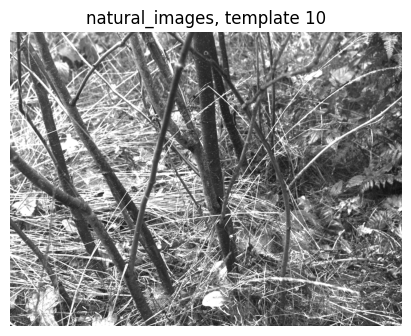

In [ ]:
plt.figure(figsize=(4, 4))
plt.imshow(nwb.stimulus['natural_images']['10'], cmap='gray')
plt.axis('off')
plt.title('natural_images, template 10')
plt.show()

# Question - Does `stimulus_condition_id` relate to the numbers in `nwb.stimulus`? It seems not — is there another way to relate them? If not, consider cutting these two cells. 

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Part 4: Put the pieces together</h2>

#### Overlay epochs on the timeseries

Shading each epoch behind the traces shows which part of the session each piece of activity came from. We shade three panels the same way, so write the shading once as a small function and call it for each panel.

</div>

In [129]:
# assign one color per stimulus name
names = epochs.stim_name.unique()
colors = dict(zip(names, plt.cm.tab10.colors))


def shade_epochs(ax):
    """Shade each epoch on ax, one color per stimulus name."""
    for name in names:
        stim = epochs[epochs.stim_name == name]

        for i, (start, stop) in enumerate(zip(stim.start_time, stim.stop_time)):
            ax.axvspan(start, stop,
                       color=colors[name],
                       alpha=0.3,
                       label=name if i == 0 else None)   # label only the first

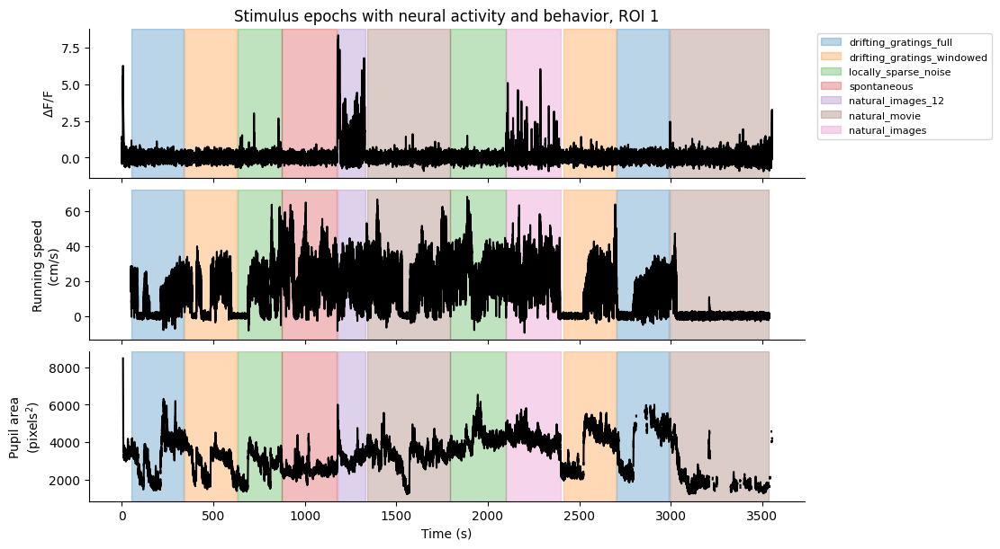

In [130]:
fig, axes = plt.subplots(3, 1, figsize=(11, 6), sharex=True)

axes[0].plot(ts, dff[:, ROI], color='black')
axes[0].set_ylabel(r'$\Delta$F/F')
axes[0].set_title(f'Stimulus epochs with neural activity and behavior, ROI {ROI}')

axes[1].plot(running_ts, running_speed, color='black')
axes[1].set_ylabel('Running speed\n(cm/s)')

axes[2].plot(eye_ts, pupil_area, color='black')
axes[2].set_ylabel('Pupil area\n(pixels$^2$)')
axes[2].set_xlabel('Time (s)')

for ax in axes:
    shade_epochs(ax)

# one legend for the whole figure, outside the axes
axes[0].legend(bbox_to_anchor=(1.01, 1.0), loc='upper left', fontsize=8)

plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Zoom in on a single stimulus presentation

To look at one presentation, select the window in **seconds** and use it to set the x limits. The x axis is already in seconds because we plotted against timestamps, so no frame conversion is needed here.

</div>

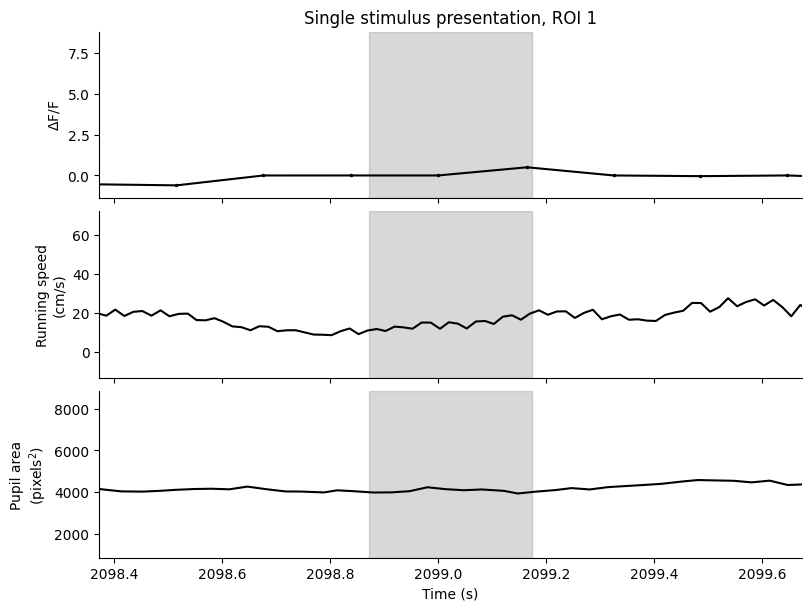

In [131]:
presentation = natural.iloc[1]      # pick one presentation
pad = 0.5                            # seconds before and after

fig, axes = plt.subplots(3, 1, figsize=(8, 6), sharex=True)

axes[0].plot(ts, dff[:, ROI], color='black', marker='.', markersize=3)
axes[0].set_ylabel(r'$\Delta$F/F')
axes[0].set_title(f'Single stimulus presentation, ROI {ROI}')

axes[1].plot(running_ts, running_speed, color='black')
axes[1].set_ylabel('Running speed\n(cm/s)')

axes[2].plot(eye_ts, pupil_area, color='black')
axes[2].set_ylabel('Pupil area\n(pixels$^2$)')
axes[2].set_xlabel('Time (s)')

for ax in axes:
    ax.axvspan(presentation.start_time, presentation.stop_time,
               color='gray', alpha=0.3)

axes[0].set_xlim(presentation.start_time - pad, presentation.stop_time + pad)

plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Part 5: Summary plots</h2>

A single presentation is too short and too noisy to tell us much. To see a response we average across all presentations of the same stimulus.

Every plot in this section is built from the same operation: take a list of event times, and pull out a window of data around each one. We write that once as a function, then reuse it for neural activity, running, and pupil.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### A reusable alignment function

This is the piece worth carrying to a new dataset. It works for any data array whose first axis is time, paired with a matching timestamps array.

</div>

In [ ]:
def align_to_events(data, timestamps, event_times, pre=0.5, post=1.5):
    """Cut a window of data around each event time.

    data        : array with time along the first axis
    timestamps  : times for each row of data, in seconds
    event_times : times to align to, in seconds
    pre, post   : seconds before and after each event

    Returns (windows, t) where t is the time axis in seconds
    relative to the event, and windows has one entry per event.
    """
    dt = np.median(np.diff(timestamps))
    n_pre, n_post = int(pre / dt), int(post / dt)

    windows = []
    for event_time in event_times:
        i = np.searchsorted(timestamps, event_time)

        # skip events too close to the start or end of the recording
        if i - n_pre >= 0 and i + n_post <= len(timestamps):
            windows.append(data[i - n_pre:i + n_post])

    t = np.arange(-n_pre, n_post) * dt
    return np.array(windows), t



    #The function returns one row per event, so `windows.shape[0]` is the number of presentations it kept and `windows.shape[1]` is the number of samples in each window.

# If you pass a 1D trace you get back `(n_events, n_samples)`. If you pass the whole 2D `dff` array you get `(n_events, n_samples, n_rois)`.

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Trial-averaged response for one ROI

The most basic summary plot. Averaging across presentations pulls the response out of the noise, and the shaded band shows how variable it was across trials.

</div>

windows shape (n_presentations, n_frames): (40, 12)


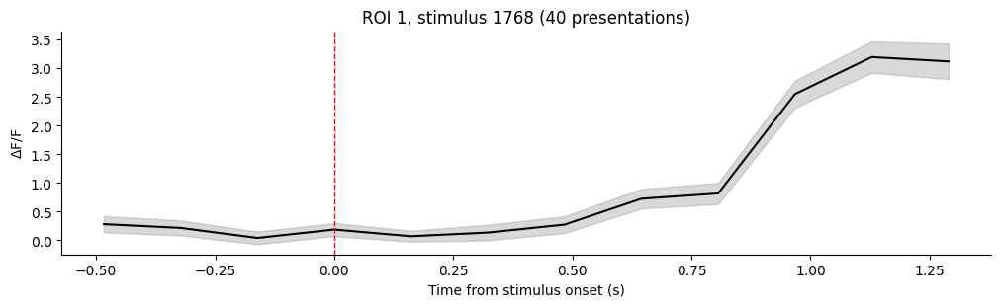

In [133]:
ROI = 1
stimulus_id = 1768

trace = np.asarray(dff[:, ROI])
onsets = stimulus_table[stimulus_table.stimulus_condition_id == stimulus_id].start_time.values

windows, t = align_to_events(trace, ts, onsets, pre=0.5, post=1.5)
print('windows shape (n_presentations, n_frames):', windows.shape)

mean = windows.mean(axis=0)
sem = windows.std(axis=0) / np.sqrt(len(windows))

plt.plot(t, mean, color='black')
plt.fill_between(t, mean - sem, mean + sem, color='gray', alpha=0.3)
plt.axvline(0, color='red', linestyle='--', linewidth=1)

plt.xlabel('Time from stimulus onset (s)')
plt.ylabel(r'$\Delta$F/F')
plt.title(f'ROI {ROI}, stimulus {stimulus_id} ({len(windows)} presentations)')
plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Neural activity and behavior aligned to the same stimulus

The same function applied to all three streams. Each has a different sampling rate, but because we align in seconds the panels line up.

</div>

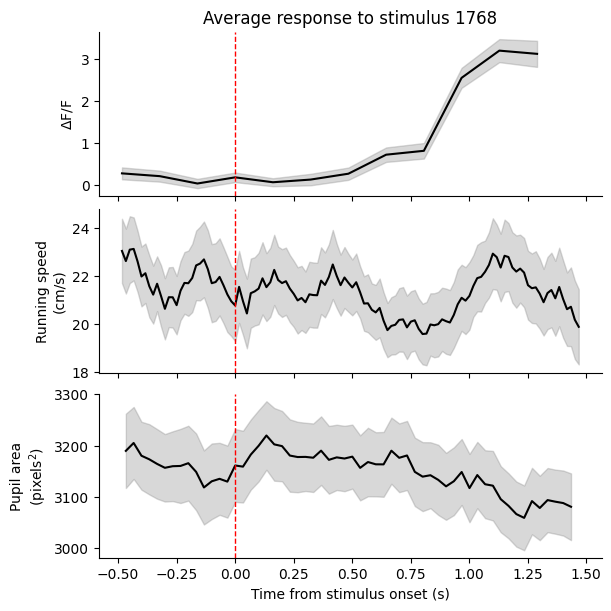

In [134]:
streams = [
    (np.asarray(dff[:, ROI]), ts, r'$\Delta$F/F'),
    (running_speed, running_ts, 'Running speed\n(cm/s)'),
    (pupil_area, eye_ts, 'Pupil area\n(pixels$^2$)'),
]

fig, axes = plt.subplots(3, 1, figsize=(6, 6), sharex=True)

for ax, (data, timestamps, label) in zip(axes, streams):
    windows, t = align_to_events(data, timestamps, onsets, pre=0.5, post=1.5)
    mean = windows.mean(axis=0)
    sem = windows.std(axis=0) / np.sqrt(len(windows))

    ax.plot(t, mean, color='black')
    ax.fill_between(t, mean - sem, mean + sem, color='gray', alpha=0.3)
    ax.axvline(0, color='red', linestyle='--', linewidth=1)
    ax.set_ylabel(label)

axes[0].set_title(f'Average response to stimulus {stimulus_id}')
axes[2].set_xlabel('Time from stimulus onset (s)')

plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

#### Response across stimuli

To ask which stimulus each ROI prefers, reduce each window to a single number: the mean activity after onset, minus the baseline before it. Doing that for every stimulus gives an ROI-by-stimulus matrix.

</div>

In [135]:
def mean_response(data, timestamps, onsets, pre=0.5, post=1.5):
    """Baseline-subtracted mean response, one value per ROI."""
    windows, t = align_to_events(data, timestamps, onsets, pre=pre, post=post)
    baseline = windows[:, t < 0].mean(axis=1)     # mean before onset
    response = windows[:, t >= 0].mean(axis=1)    # mean after onset
    return (response - baseline).mean(axis=0)     # average over presentations

responses shape (n_rois, n_conditions): (9, 20)


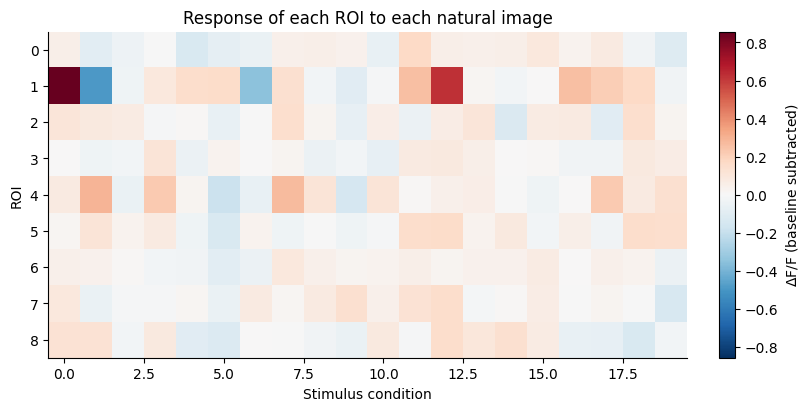

In [138]:
# take the first 20 natural image conditions so the plot stays readable
conditions = np.sort(natural.stimulus_condition_id.unique())[:20]

responses = []
for condition in conditions:
    onsets = natural[natural.stimulus_condition_id == condition].start_time.values
    responses.append(mean_response(dff, ts, onsets))

responses = np.array(responses).T    # (n_rois, n_conditions)
print('responses shape (n_rois, n_conditions):', responses.shape)

plt.figure(figsize=(8, 4))
plt.imshow(responses, aspect='auto', cmap='RdBu_r',
           vmin=-np.abs(responses).max(), vmax=np.abs(responses).max())
plt.colorbar(label=r'$\Delta$F/F (baseline subtracted)')
plt.xlabel('Stimulus condition')
plt.ylabel('ROI')
plt.title('Response of each ROI to each natural image')
plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

<h2>Exercise</h2>

Take a new dataset and run the same five steps, in groups, at your own pace.

Produce a stimulus-aligned neural activity response across units or ROIs, and a README using the template.

</div>